In [1]:
import numpy as np
import math
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt
import imageio
import networkx as nx
import seaborn as sns
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.tile_providers import CARTODBPOSITRON, get_provider
from bokeh.transform import factor_cmap, factor_mark, linear_cmap, log_cmap
from bokeh.palettes import Spectral6, Plasma6
from bokeh.models import markers, Segment, Plot
from bokeh.models.expressions import CumSum

output_notebook()

Loading BokehJS ...

In [2]:
df = pd.read_csv('SouthCalifornia-1982-2011_Physics-of-Data.dat', sep=' ', names=['n', 'pointer', 't', 'mag', 'x', 'y', 'z'])
df['date'] = pd.to_datetime(df['t'], unit='s', origin='01/01/1982')
df.head()

,n,pointer,t,mag,x,y,z,date
0,0,-1,0.00000,2.71,-2571956,-4627162,3520602,1982-01-01 00:00:00.000000000
1,1,0,36501.39072,2.12,-2363740,-4787011,3461373,1982-01-01 10:08:21.390720010
2,2,0,37488.27744,2.33,-2363746,-4786942,3461232,1982-01-01 10:24:48.277440012
3,3,0,47982.51648,2.57,-2475085,-4664024,3548479,1982-01-01 13:19:42.516480029
4,4,0,60268.57056,2.98,-2238642,-4839098,3469546,1982-01-01 16:44:28.570559978


Functions for converting from latitude and longitude to Mercador coordinates

In [3]:
def merc_x(lon):
  r_major=6378137.000
  return r_major*math.radians(lon)

def merc_y(lat):
  if lat>89.5:lat=89.5
  if lat<-89.5:lat=-89.5
  r_major=6378137.000
  r_minor=6356752.3142
  temp=r_minor/r_major
  eccent=math.sqrt(1-temp**2)
  phi=math.radians(lat)
  sinphi=math.sin(phi)
  con=eccent*sinphi
  com=eccent/2
  con=((1.0-con)/(1.0+con))**com
  ts=math.tan((math.pi/2-phi)/2)/con
  y=0-r_major*math.log(ts)
  return y

In [33]:
R = 6371000. #Earth radius
df['lat'] = np.arcsin(df['z']/R)*180./np.pi
df['long'] = np.arctan2(df['y'], df['x'])*180./np.pi
df['dep'] = R-np.sqrt(df['x']**2+df['y']**2+df['z']**2)
df['x_merc'] = df['long'].apply(merc_x)
df['y_merc'] = df['lat'].apply(merc_y)
#df.describe()

## 2D spatial visualization

In [37]:
tile_provider = get_provider(CARTODBPOSITRON)
x_range, y_range = (-13600000, -12500000), (3480000, 4500000)
p1 = figure(x_range=x_range, y_range=y_range,
           x_axis_type='mercator', y_axis_type='mercator', title='Map of earthquake distribution')
p1.add_tile(tile_provider)

#Creating a copy of the data for plotting
df1 = df.sort_values(by='mag') #sorting w.r.t. magnitude for better visualization
df1['mag'] = df1['mag'].round(0) #round mag values
df1['mark_size'] = df1['mag']**1.4
df1['alpha'] = df1['mag']/10.

mapper = log_cmap(field_name='mag', palette=Spectral6, low=2, high=7)
p1.scatter('x_merc', 'y_merc', source=df1, legend_field='mag', fill_alpha='alpha',
          size='mark_size', fill_color=mapper, line_color=None)
show(p1)

## Earthquake's trend

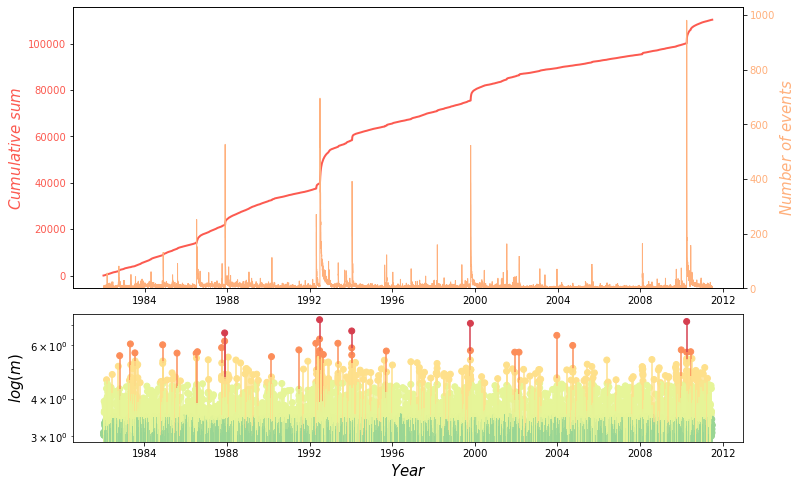

In [29]:
mag_mask = df['mag'] > 3
c_index = df['mag'][mag_mask].round(0).astype('int32').values - 2
spectral6 = np.asarray(Spectral6)

gridsize = (3, 1)
fig = plt.figure(figsize=(12,8))

ax1 = plt.subplot2grid(gridsize, (0, 0), colspan=1, rowspan=2)
ax1_color = 'xkcd:coral'
ax1.plot(df['date'], df['n'], lw=2, c= ax1_color)
#ax1.grid(ls='--')
ax1.set_ylabel('$Cumulative~sum$', size=15, color=ax1_color)
ax1.tick_params(axis='y', labelcolor=ax1_color)

ax2 = ax1.twinx()
ax2_color = 'xkcd:peach'
ax2.set_ylabel('$Number~of~events$', color=ax2_color, size=15)
ax2.hist(df['date'], histtype='step', bins=29*365, color=ax2_color);
ax2.tick_params(axis='y', labelcolor=ax2_color)

ax3 = plt.subplot2grid(gridsize, (2, 0))
ax3.scatter(df['date'][mag_mask], df['mag'][mag_mask], c=spectral6[c_index])
ax3.vlines(df['date'][mag_mask], 0, df['mag'][mag_mask], colors=spectral6[c_index])
ax3.set_yscale('log')
ax3.set_xlabel('$Year$', size=15)
ax3.set_ylabel('$log(m)$', size=15);

## Network

In [30]:
def get_swarm(df, date_range, magth, central_event):
    mask1 = (df['date'] > date_range[0]) & (df['date'] < date_range[1]) & (df['mag'] > magth)
    dn = df[mask1]
    net = nx.from_pandas_edgelist(dn, source='n', target='pointer', create_using=nx.MultiGraph())
    main_nodes = nx.node_connected_component(net, central_event)   #nodes of the connected component of the central event. Needs to be converted
    main_net_temp = nx.subgraph(net, main_nodes)                   #network of the principal connected component
    df_mask = np.asarray(nx.nodes(main_net_temp))                  #list of nodes of the connected components
    df_mask = np.delete(df_mask, df_mask == -1)
    main_df = df.loc[df_mask]                                      # df with just the interesting nodes
    return main_df

In [31]:
def network(df, date_range, magth, central_event, directed=False):
    main_df = get_swarm(df, date_range, magth, central_event)
    kind = 0
    if (directed):
        kind = nx.MultiDiGraph()
    else: kind = nx.MultiGraph()
    main_net = nx.from_pandas_edgelist(main_df, source='pointer', target='n', create_using=kind)
    colors = main_df['mag'].round(0)
    colors = colors.reindex(main_net.nodes()) # this is needed for assigning each node to the corresponding color
    return (main_net, colors)

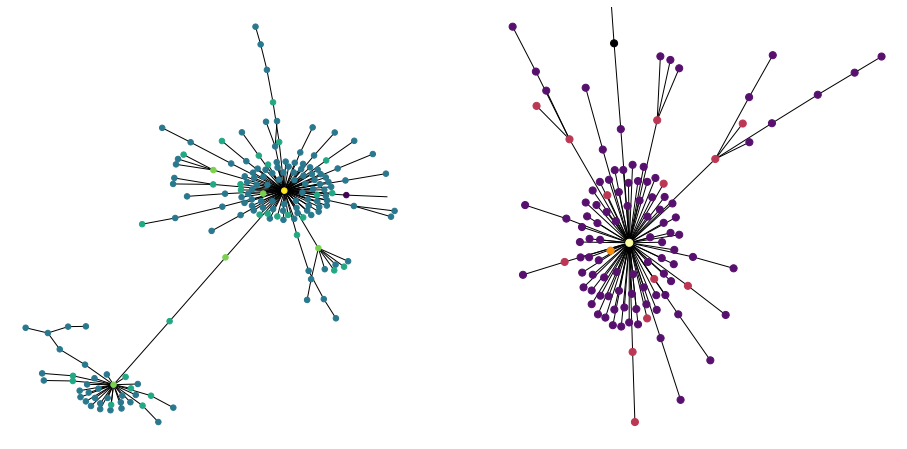

In [38]:
net1, colors1 = network(df, ('01/05/1992', '01/05/1993'), 3.7, 39805)
net2, colors2 = network(df, ('01/09/1999', '01/09/2000'), 3.5, 75422)
fig_net = plt.figure(figsize=(16,8))
fig_net.add_subplot(121)
nx.draw(net1, node_size=30, node_color=colors1, cmap=plt.cm.viridis)
fig_net.add_subplot(122)
nx.draw(net2, node_size=50, node_color=colors2, cmap=plt.cm.inferno)